In [1]:
# install dependencies: 
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

     |████████████████████████████████| 276kB 31.2MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44091 sha256=1b3c588145683d358b2caba2333a8bda0f1a82b0d25d5c777de0d85e391ba3bd
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
1.8.1+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.8)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
import torch
assert torch.__version__.startswith("1.8")   # need to manually install torch 1.8 if Colab changes its default version
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
     |████████████████████████████████| 6.2MB 636kB/s 
     |████████████████████████████████| 51kB 7.7MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.3.post20210317-cp37-none-any.whl size=58543 sha256=666dec48d902676026cf7c0a465eb36b601171a0d0d22fad60e485a876beafe2
  Stored in directory: /root/.cache/pip/wheels/d2/ee/3a/5c531df777c03d8c67f22c65f97d6f75321087482d05a9b218
Successfully built fvcore


In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [2]:
#drive'ı projeye ekleme
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [10]:
!unzip cow.zip > /dev/null

In [32]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("cow", {}, "./cow/train/train_coco.json", "./cow/train")

AssertionError: ignored

In [33]:
cow_metadata = MetadataCatalog.get("cow")
print(cow_metadata)
dataset_dicts = DatasetCatalog.get("cow")
print(dataset_dicts)

Metadata(evaluator_type='coco', image_root='./cow/train', json_file='./cow/train/train_coco.json', name='cow', thing_classes=['Cow', 'Head', 'Tail', 'LHL', 'RHL', 'RFL', 'LFL'], thing_dataset_id_to_contiguous_id={1: 0, 2: 1, 3: 2, 4: 3, 5: 4, 6: 5, 7: 6})
[06/02 19:49:28 d2.data.datasets.coco]: Loaded 57 images in COCO format from ./cow/train/train_coco.json
[{'file_name': './cow/train/1_HolsteinAngusMelez_Back_LiveWeight_419_CarcassWeight_235_01.jpg', 'height': 1280, 'width': 961, 'image_id': 1, 'annotations': [{'iscrowd': 0, 'bbox': [210.0, 1.0, 599.0, 1259.0], 'category_id': 0, 'segmentation': [[620.1578947368421, 3.9473684210526314, 593.8421052631579, 13.157894736842104, 559.6315789473683, 21.05263157894737, 534.6315789473683, 21.05263157894737, 500.42105263157896, 11.842105263157894, 491.21052631578937, 23.684210526315788, 503.0526315789473, 44.73684210526316, 503.0526315789473, 68.42105263157895, 476.7368421052631, 63.1578947368421, 445.1578947368421, 60.526315789473685, 425.4210

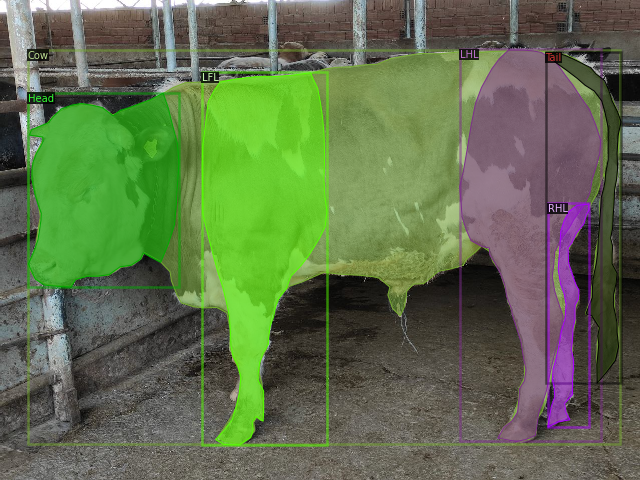

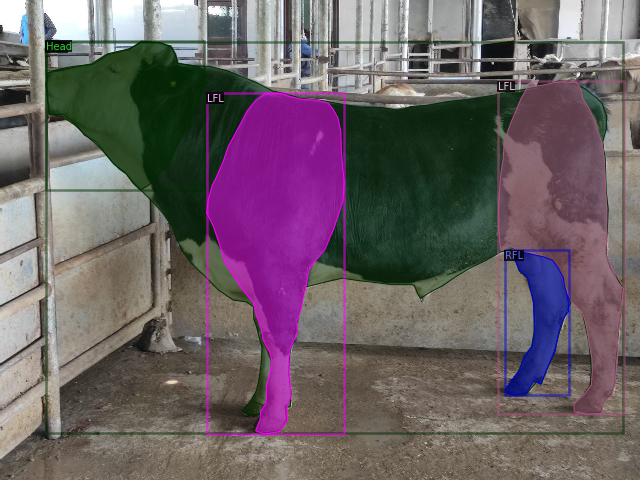

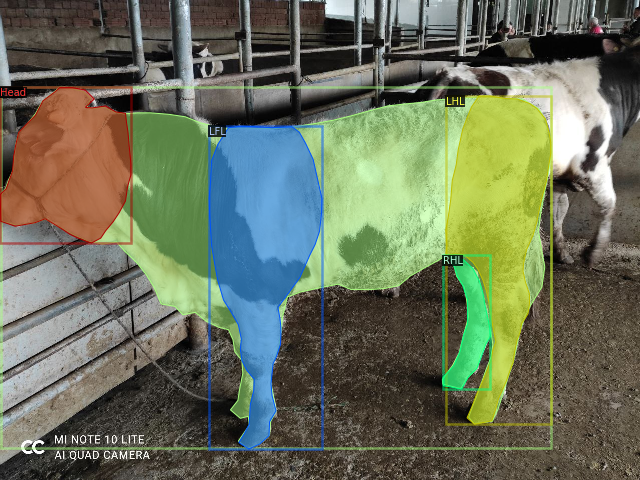

In [13]:
#training setinden örnekler
import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=cow_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [14]:
#model dosyası alınması
!wget https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl -q -O model_final_f10217.pkl


In [15]:
#modelin eğitimi
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("cow",)
cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "./model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.02
cfg.SOLVER.MAX_ITER = (300)  # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (128)  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7  # 6 classes 

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[06/02 19:37:58 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (28, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (28,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (7, 256, 1, 1) 

[06/02 19:38:00 d2.engine.train_loop]: Starting training from iteration 0
[06/02 19:38:08 d2.utils.events]:  eta: 0:01:56  iter: 19  total_loss: 3.409  loss_cls: 1.592  loss_box_reg: 0.9434  loss_mask: 0.6845  loss_rpn_cls: 0.06149  loss_rpn_loc: 0.0999  time: 0.4134  data_time: 0.0204  lr: 0.00039962  max_mem: 2337M
[06/02 19:38:17 d2.utils.events]:  eta: 0:01:49  iter: 39  total_loss: 2.52  loss_cls: 0.8432  loss_box_reg: 0.9605  loss_mask: 0.6244  loss_rpn_cls: 0.0243  loss_rpn_loc: 0.07142  time: 0.4211  data_time: 0.0092  lr: 0.00079922  max_mem: 2337M
[06/02 19:38:26 d2.utils.events]:  eta: 0:01:40  iter: 59  total_loss: 2.197  loss_cls: 0.7024  loss_box_reg: 0.9223  loss_mask: 0.4584  loss_rpn_cls: 0.01195  loss_rpn_loc: 0.09033  time: 0.4246  data_time: 0.0102  lr: 0.0011988  max_mem: 2338M
[06/02 19:38:34 d2.utils.events]:  eta: 0:01:32  iter: 79  total_loss: 1.725  loss_cls: 0.5402  loss_box_reg: 0.7828  loss_mask: 0.3068  loss_rpn_cls: 0.009279  loss_rpn_loc: 0.07584  time: 

In [28]:
#tahmin nesnesi
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("cow", )
predictor = DefaultPredictor(cfg)



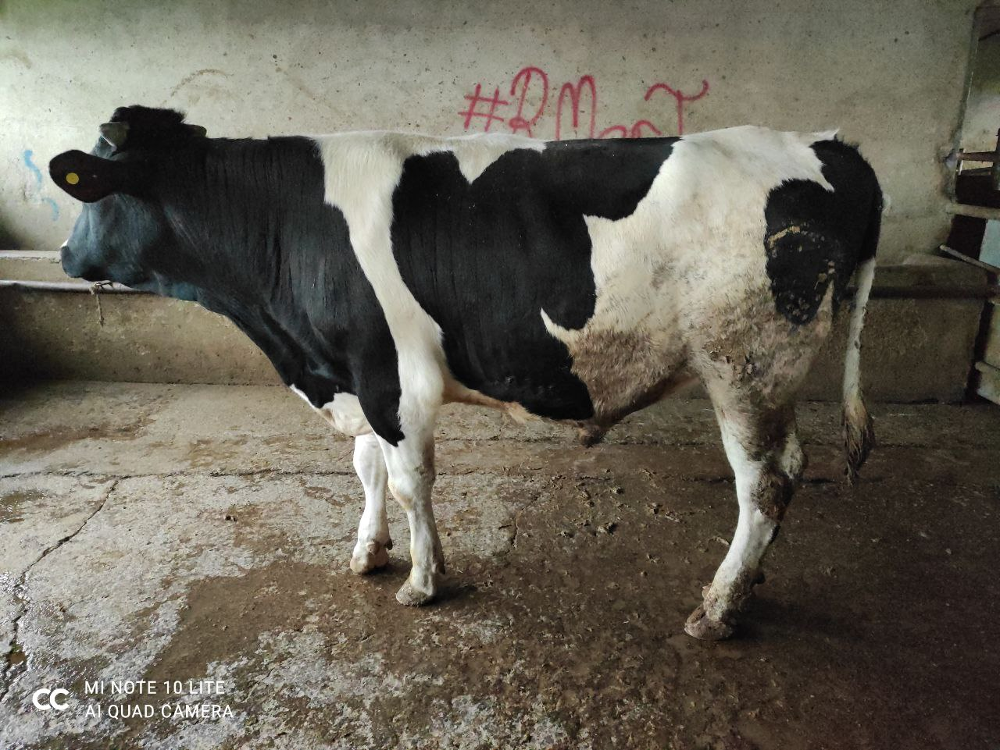

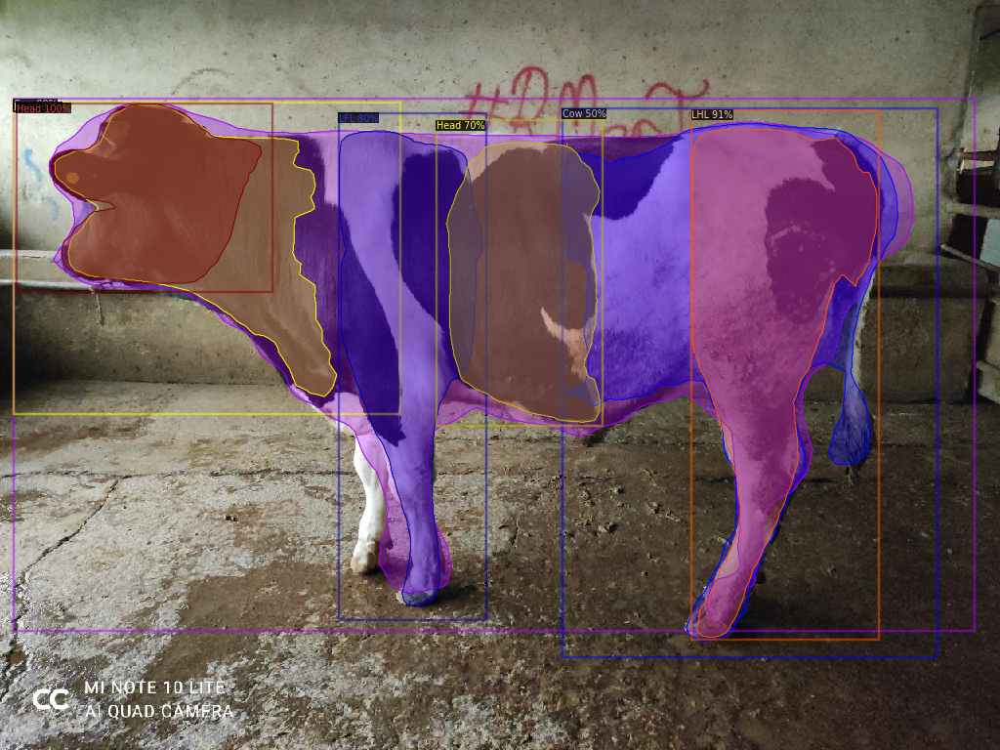

In [29]:
#tahminler
from detectron2.utils.visualizer import ColorMode
im = cv2.imread("./cow/test/1.jpg")
cv2_imshow(im)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
                   metadata=cow_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])


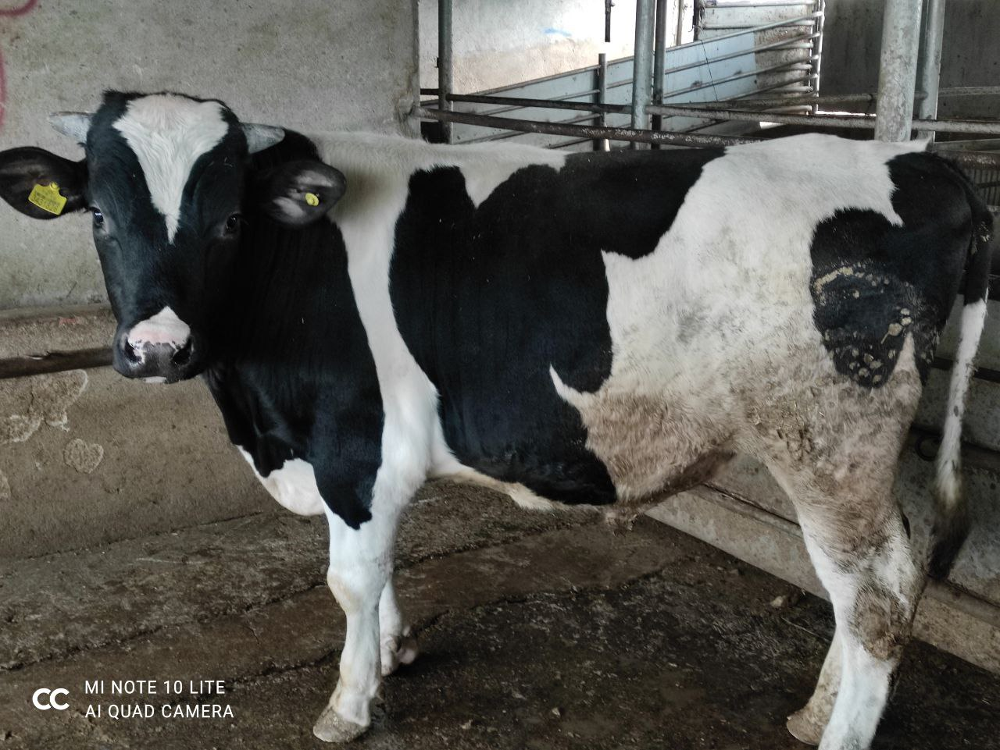

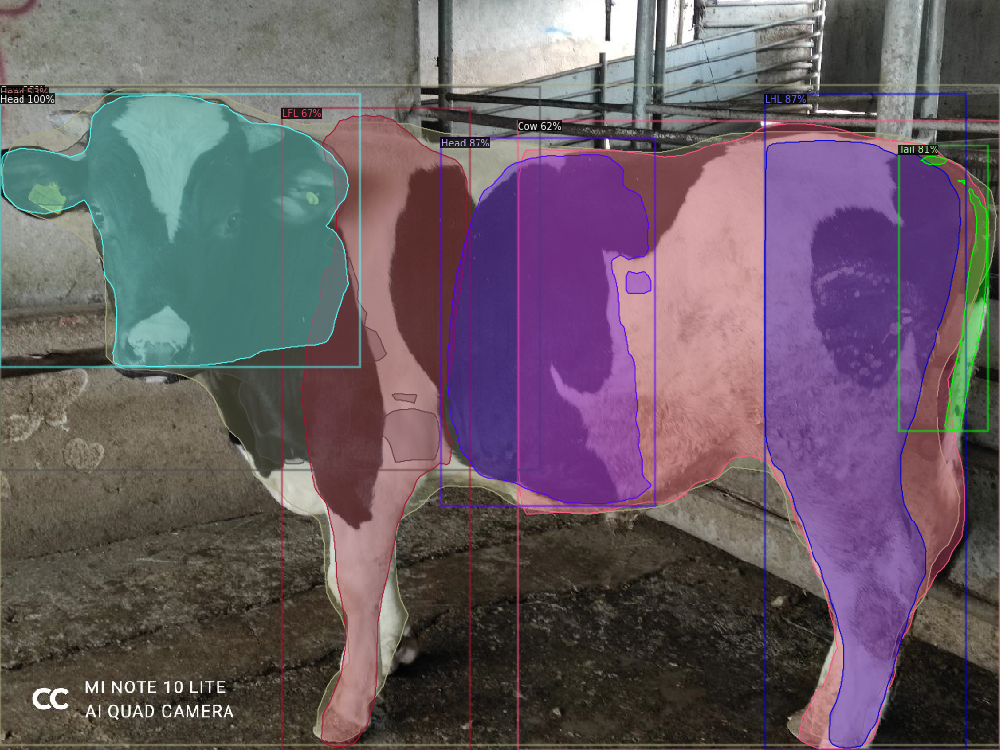

In [30]:
#tahminler
from detectron2.utils.visualizer import ColorMode
im = cv2.imread("./cow/test/2.jpg")
cv2_imshow(im)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
                   metadata=cow_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])


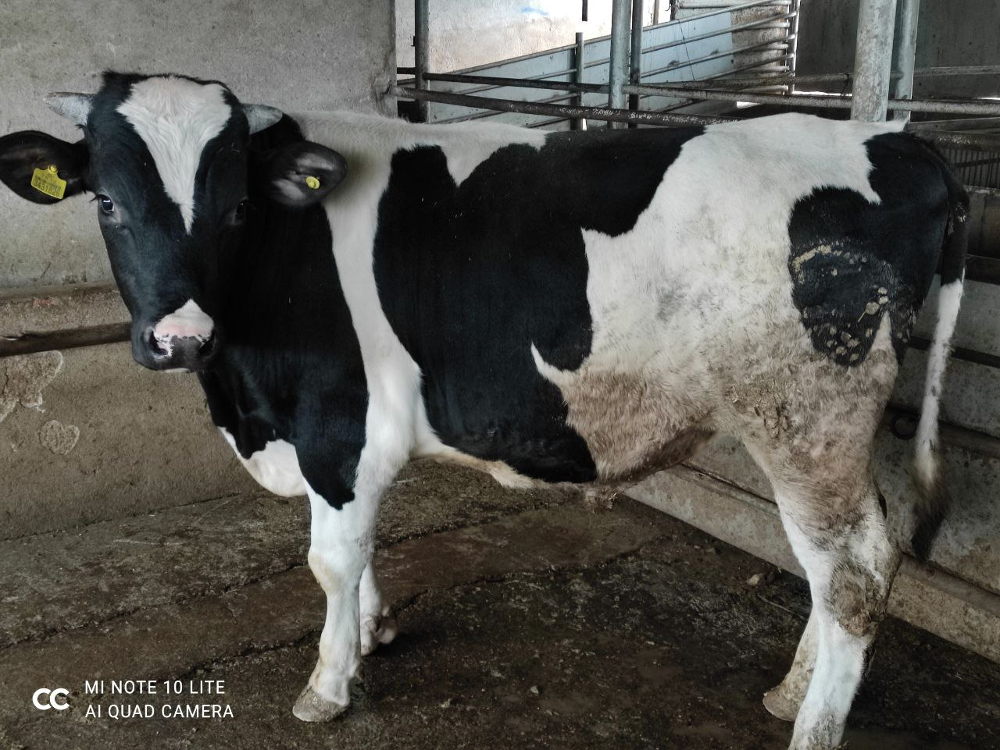

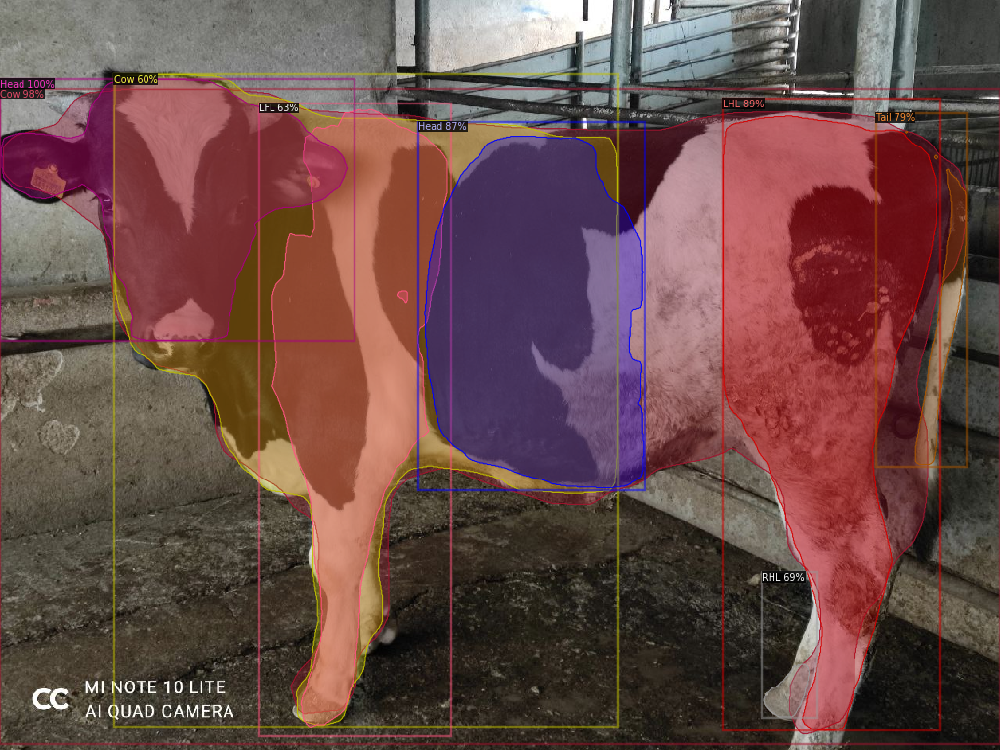

In [31]:
#tahminler
from detectron2.utils.visualizer import ColorMode
im = cv2.imread("./cow/test/3.jpg")
cv2_imshow(im)
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
                   metadata=cow_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])
